Import Necessary Packages and Classes from Other Files 

In [1]:
# Imports
import numpy as np
import matplotlib.pyplot as plt
from Channel import Channel
from beam_gen import BeamGen
from simulation import Simulation

In [2]:
# Define secret key rate functions 
def h(d, qber): 
    return -qber * np.log2(qber / (d - 1)) - (1 - qber) * np.log2(1 - qber) 

def secret_key_rate(d, qber): 
    return np.log2(d) - 2*h(d,qber)

Simulation of OAM Basis: 

In [5]:
# Constant Definitions
units = "mm"
beamWaist = 2  # Define beam waist of 2 mm
apperture = 20  # Define apperature of 2 cm
wavelength = 810E-6  # Define wavelenegth of 10 nm
observed_length = 30  # Define observed length for both the x and y directions of 2 cm
N = 500  # Number of points used for computation in both the x and y directions
num_simulations = 20

Weak Abbarations

In [9]:
# Define more specific constants

#max_ell = 5   # Define maximum used ell parameter for LG beams in OAM
propagation_distance = 1000E3  # Propagation distance of 1 km

use_aberration = False

if use_aberration:
    aberation_strength = "weak"  # Define aberation strength as medium
    n_max = 4  # Define Zernike polynomial max n parameters

    # Get aberation strength range based on strength
    if aberation_strength == "weak":
        min_strength = 0.0
        max_strength = 0.2
    elif aberation_strength == "medium":
        min_strength = 0.4
        max_strength = 0.6
    elif aberation_strength == "strong":
        min_strength = 0.8
        max_strength = 1

    # Define Zernike polynomial parameters

    n = []
    for i in range(n_max):
        # Repeat each n index a number of times equal to its location in the pyramid
        for j in range(i + 1):
            n.append(i)

    m = []
    for n_idx in range(n_max):
        for m_val in range(-n_idx, n_idx + 1, 2):
            m.append(m_val)

    strengths = []  # Initialized strength list

    # Generate random strengths of Zernike polynomials
    np.random.seed(0)  # Define seed

    for i in range(len(n)):  # Iterate over all Zerinke indices
        strength = np.random.rand() * (max_strength - min_strength) + min_strength
        strengths.append(strength)

Define Individual Simulation:

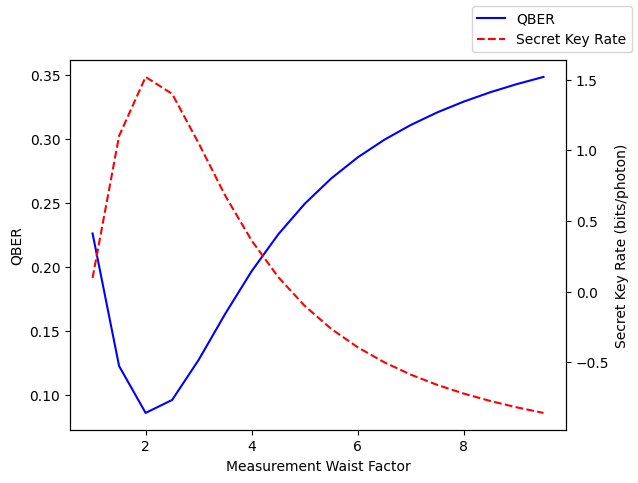

In [16]:
# Define simulation
sim = Simulation(L=observed_length, N=N, wavelength=wavelength, units=units)

# Define OAM Basis
max_ell = 3
ell_values = np.arange(-max_ell, max_ell+1)

for l in ell_values:
    sim.add_beam_gen(ell=l, p=0, beam_waist=beamWaist)

# Add initial apperture
sim.add_channel(type=Channel.LENS, diam=apperture)
#sim.add_channel(type=Channel.ABBARATION, n=n, m=m, stre=np.array(strengths), app=apperture)
sim.add_channel(type=Channel.FREE_SPACE, dist=propagation_distance)
sim.add_channel(type=Channel.LENS, diam=apperture)

channel_idx = 3

# Run Simulation
sim.run(use_mub=True)

# Observe affect of changing waist param of measurement basis
waist_factor = np.arange(1, 10, 0.5)

#inner_products = np.zeros(len(waist_factor))
qber = np.zeros(len(waist_factor))
key_rate = np.zeros(len(waist_factor))

for i in range(len(waist_factor)):

    for l in ell_values:
        sim.add_measurement_basis(ell=l, p=0, beam_waist = waist_factor[i]*beamWaist)
    
    sim.add_measurement_basis(generate_mub=True)
    
    #sim.add_measurement_basis(ell=-3, p=0, beam_waist=waist_factor[i]*beamWaist)
    #inner_products[i] = sim.compute_inner_product(0, 0, channel_index_1=channel_idx, use_measurement_basis_for_2=True)
    qber[i] = sim.compute_qber(channel_idx, use_measurement_basis = True, separate_mub = True)
    key_rate[i] = secret_key_rate(2*max_ell + 1, qber[i])

    sim.delete_measurement_basis()

fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

ax1.plot(waist_factor, qber, label="QBER", color='blue', )
ax2.plot(waist_factor, key_rate, '--r', label="Secret Key Rate")
ax1.set_xlabel("Measurement Waist Factor")
ax1.set_ylabel("QBER")
ax2.set_ylabel("Secret Key Rate (bits/photon)")
fig.legend()
plt.show()


Using Same Measurement Basis as Transmitted Basis 

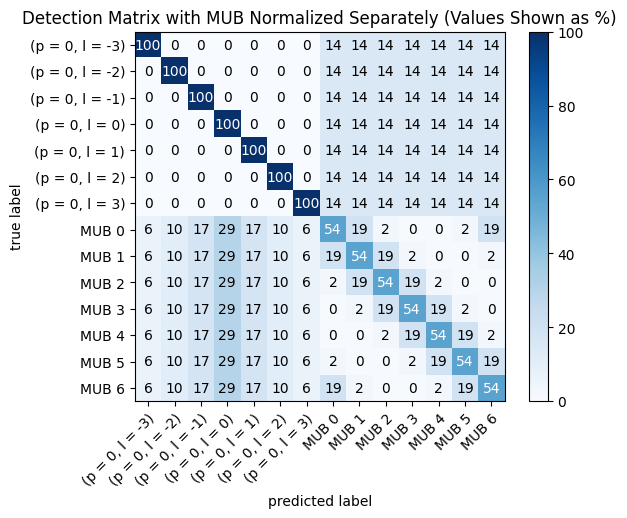

In [15]:
# Define simulation
sim = Simulation(L=observed_length, N=N, wavelength=wavelength, units=units)

# Define OAM Basis
max_ell = 3
ell_values = np.arange(-max_ell, max_ell+1)

for l in ell_values:
    sim.add_beam_gen(ell=l, p=0, beam_waist=beamWaist)

# Add initial apperture
sim.add_channel(type=Channel.LENS, diam=apperture)
#sim.add_channel(type=Channel.ABBARATION, n=n, m=m, stre=np.array(strengths), app=apperture)
sim.add_channel(type=Channel.FREE_SPACE, dist=propagation_distance)
sim.add_channel(type=Channel.LENS, diam=apperture)

sim.run(use_mub=True)

sim.plot_detection_matrix(separate_mub=True, channel_index=3)

In [21]:
# Define simulation
sim = Simulation(L=observed_length, N=N, wavelength=wavelength, units=units)

# Define OAM Basis
max_ell = 3
ell_values = np.arange(-max_ell, max_ell+1)

for l in ell_values:
    sim.add_beam_gen(ell=l, p=0, beam_waist=beamWaist)

waist_factor = 2

sim.delete_measurement_basis()

for l in ell_values:
    sim.add_measurement_basis(ell=l, p=0, beam_waist=waist_factor*beamWaist)

sim.add_measurement_basis(generate_mub=True)

# Add initial apperture
sim.add_channel(type=Channel.LENS, diam=apperture)
#sim.add_channel(type=Channel.ABBARATION, n=n, m=m, stre=np.array(strengths), app=apperture)
sim.add_channel(type=Channel.FREE_SPACE, dist=propagation_distance)
sim.add_channel(type=Channel.LENS, diam=apperture)

sim.run(use_mub=True)

sim.plot_detection_matrix(separate_mub=True, channel_index=3, use_measurement_basis=True)


Exception: Number of beams in measurement basis does not match number of generated beams. 

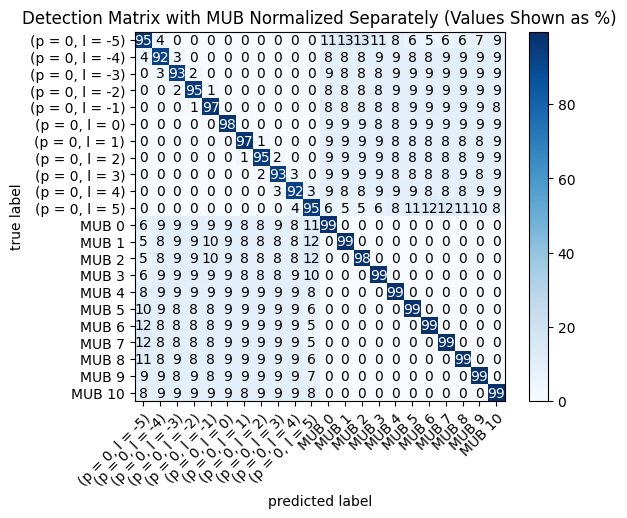

In [ ]:
sim = []

# Define sets of simulations 
for i in range(10): 
    sim[i] = 

Plot Initial Beams: 

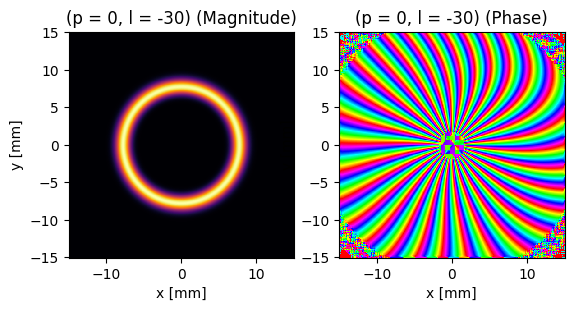

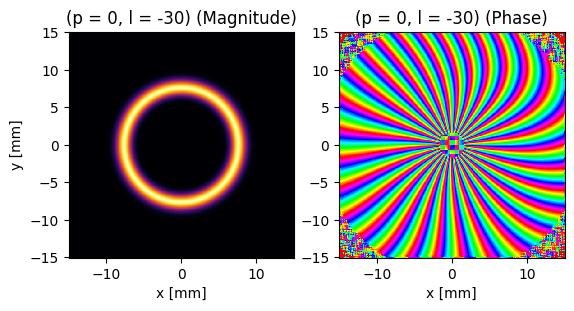

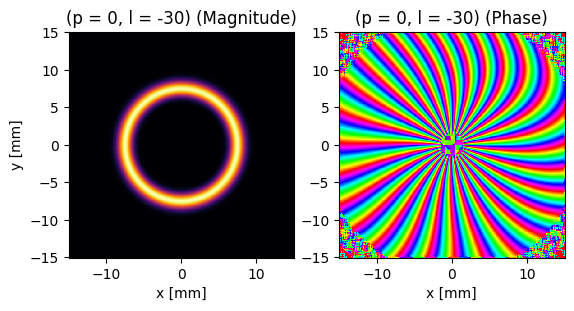

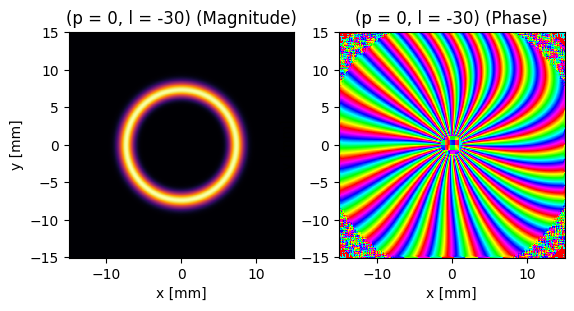

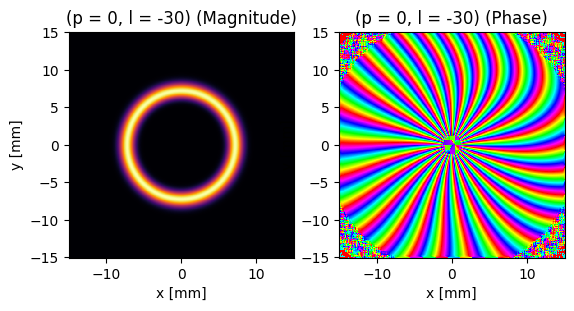

...

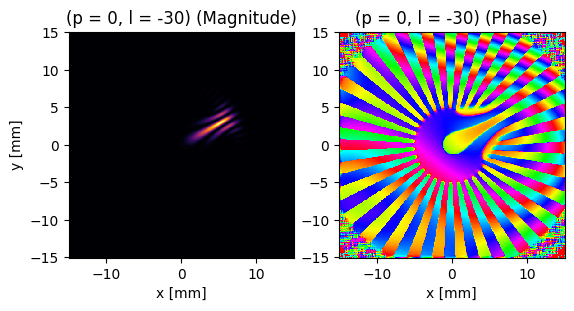

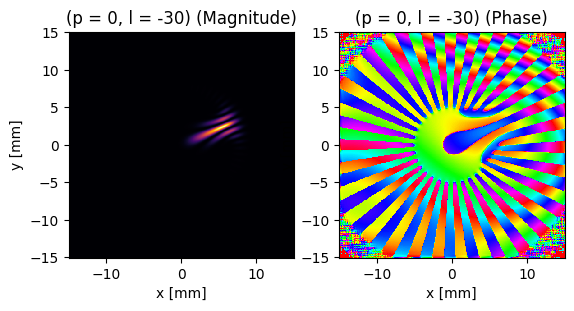

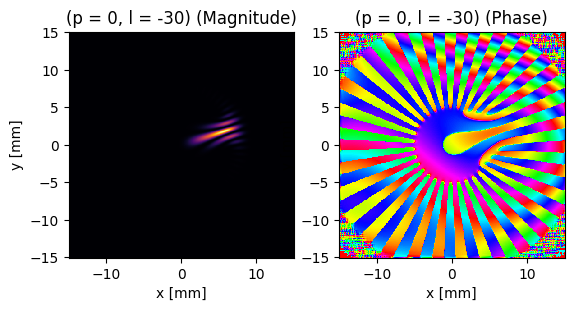

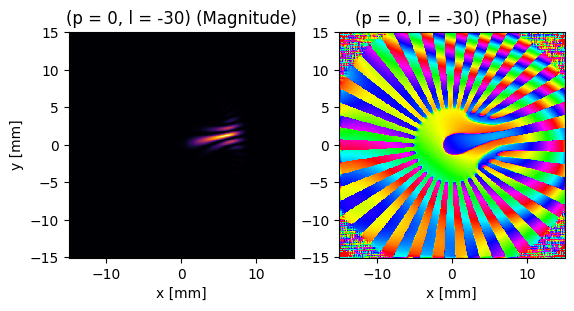

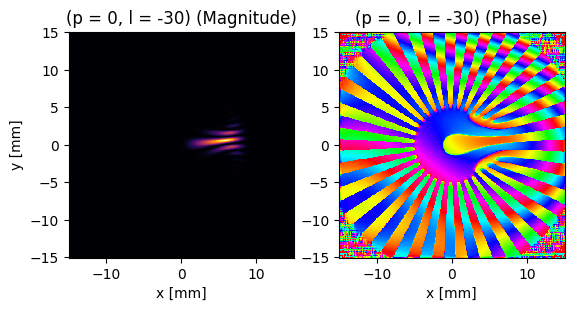

In [16]:
channel_idx = 4

for i in range(2*(2*max_ell + 1)):
    sim.plot_beams(channel_index=channel_idx, run_indices=[i])

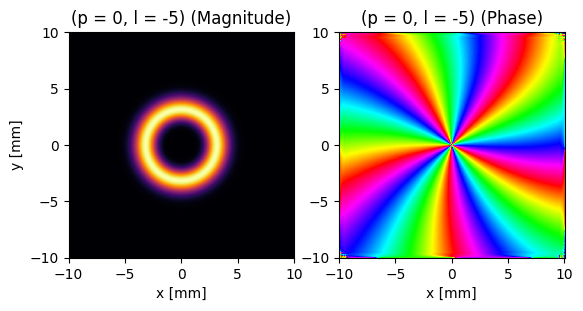

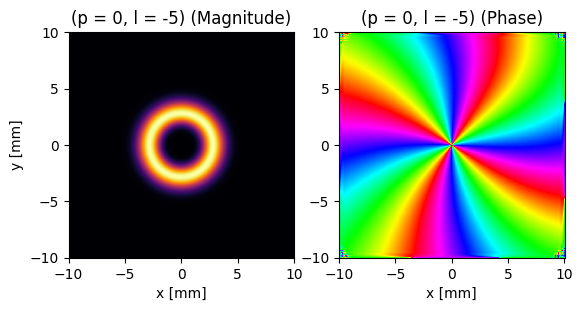

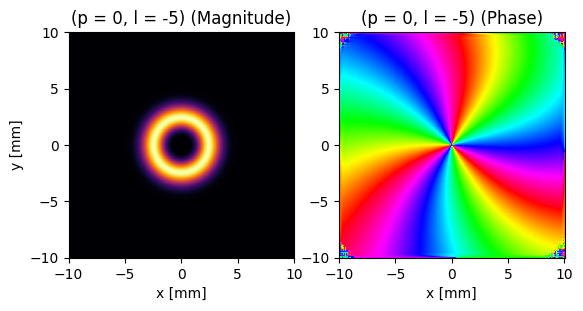

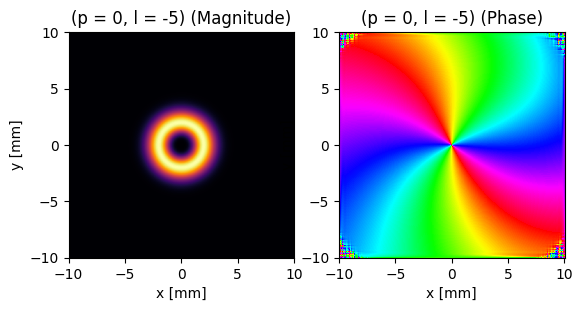

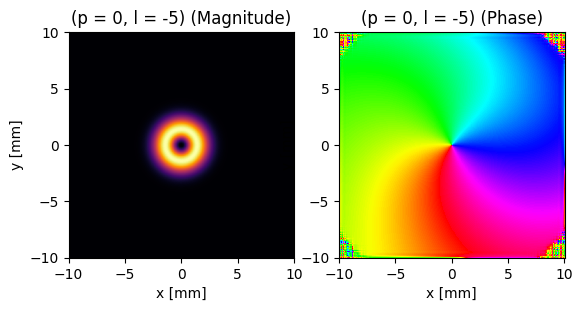

...

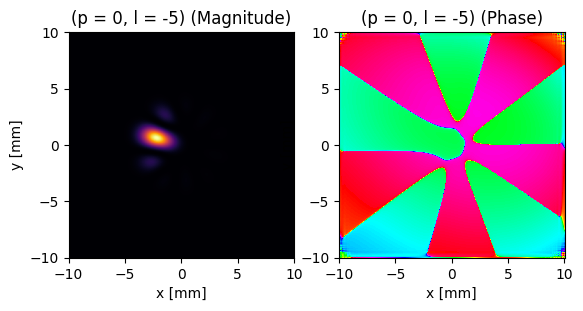

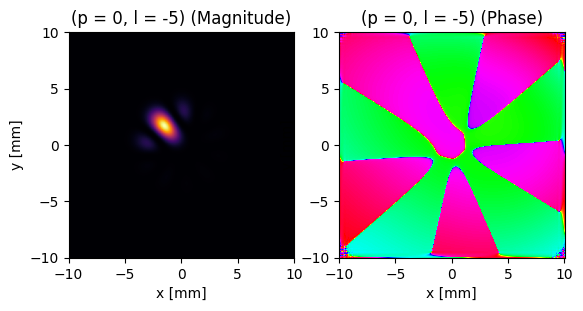

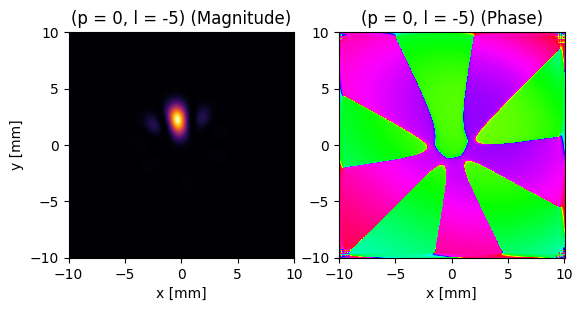

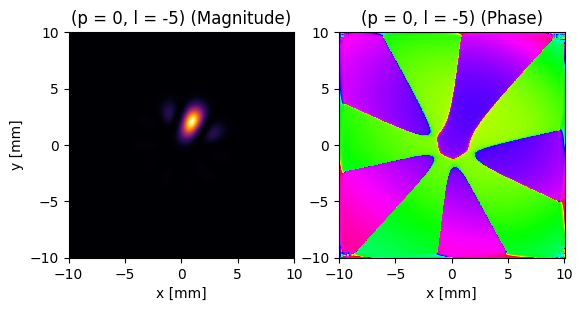

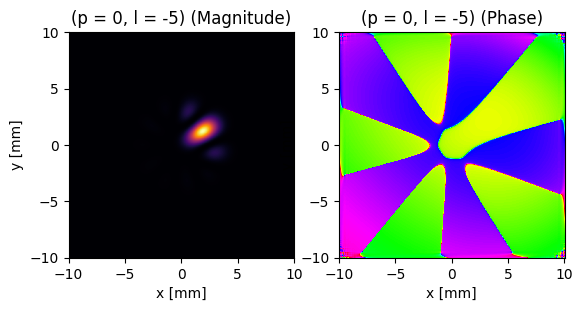

In [ ]:
channel_idx = 4

for i in range(2*(2*max_ell + 1)):
    sim.plot_beams(channel_index=channel_idx, run_indices=[i])
